# Explore the dataset


In this notebook, we will perform an EDA (Exploratory Data Analysis) on the processed Waymo dataset (data in the `processed` folder). In the first part, you will create a function to display 

In [1]:
from utils import get_dataset
from tqdm.notebook import tqdm
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import matplotlib.ticker as ticker
import tensorflow as tf
import seaborn as sns
import pandas as pd
import numpy as np
import glob

%matplotlib inline

In [2]:
dataset = get_dataset("processed_data/processed/*.tfrecord")

INFO:tensorflow:Reading unweighted datasets: ['processed_data/processed/*.tfrecord']
INFO:tensorflow:Reading record datasets for input file: ['processed_data/processed/*.tfrecord']
INFO:tensorflow:Number of filenames to read: 100
Instructions for updating:
Use `tf.data.Dataset.interleave(map_func, cycle_length, block_length, num_parallel_calls=tf.data.AUTOTUNE)` instead. If sloppy execution is desired, use `tf.data.Options.experimental_deterministic`.
Instructions for updating:
Use `tf.data.Dataset.map()


In [3]:
feature_description = {
    "image/height": tf.io.FixedLenFeature([], tf.int64, default_value=0),
    "image/width": tf.io.FixedLenFeature([], tf.int64, default_value=0),
    "image/filename": tf.io.FixedLenFeature([], tf.string, default_value=""),
    "image/source_id": tf.io.FixedLenFeature([], tf.string, default_value=""),
    "image/encoded": tf.io.FixedLenFeature([], tf.string, default_value=""),
    "image/format": tf.io.FixedLenFeature([], tf.string, default_value=""),
    "image/object/bbox/xmin": tf.io.VarLenFeature(tf.float32),
    "image/object/bbox/xmax": tf.io.VarLenFeature(tf.float32),
    "image/object/bbox/ymin": tf.io.VarLenFeature(tf.float32),
    "image/object/bbox/ymax": tf.io.VarLenFeature(tf.float32),
    "image/object/class/text": tf.io.VarLenFeature(tf.string),
    "image/object/class/label": tf.io.VarLenFeature(tf.int64),
}


def parse_dataset(example_proto):
    return tf.io.parse_single_example(example_proto, feature_description)

In [4]:
filenames = glob.glob("processed_data/processed/*.tfrecord")
unprocessed_dataset = tf.data.TFRecordDataset(filenames).map(parse_dataset)

In [5]:
print("Processed dataset-")
display(dataset)

print("Unprocessed dataset-")
display(unprocessed_dataset)

Processed dataset-


<DatasetV1Adapter shapes: {image: (None, None, 3), source_id: (), key: (), filename: (), groundtruth_image_confidences: (None,), groundtruth_verified_neg_classes: (None,), groundtruth_not_exhaustive_classes: (None,), groundtruth_boxes: (None, 4), groundtruth_area: (None,), groundtruth_is_crowd: (None,), groundtruth_difficult: (None,), groundtruth_group_of: (None,), groundtruth_weights: (None,), groundtruth_classes: (None,), groundtruth_image_classes: (None,), original_image_spatial_shape: (2,)}, types: {image: tf.uint8, source_id: tf.string, key: tf.string, filename: tf.string, groundtruth_image_confidences: tf.float32, groundtruth_verified_neg_classes: tf.int64, groundtruth_not_exhaustive_classes: tf.int64, groundtruth_boxes: tf.float32, groundtruth_area: tf.float32, groundtruth_is_crowd: tf.bool, groundtruth_difficult: tf.int64, groundtruth_group_of: tf.bool, groundtruth_weights: tf.float32, groundtruth_classes: tf.int64, groundtruth_image_classes: tf.int64, original_image_spatial_sh

Unprocessed dataset-


<MapDataset shapes: {image/object/bbox/xmax: (None,), image/object/bbox/xmin: (None,), image/object/bbox/ymax: (None,), image/object/bbox/ymin: (None,), image/object/class/label: (None,), image/object/class/text: (None,), image/encoded: (), image/filename: (), image/format: (), image/height: (), image/source_id: (), image/width: ()}, types: {image/object/bbox/xmax: tf.float32, image/object/bbox/xmin: tf.float32, image/object/bbox/ymax: tf.float32, image/object/bbox/ymin: tf.float32, image/object/class/label: tf.int64, image/object/class/text: tf.string, image/encoded: tf.string, image/filename: tf.string, image/format: tf.string, image/height: tf.int64, image/source_id: tf.string, image/width: tf.int64}>

## Write a function to display an image and the bounding boxes

Implement the `display_instances` function below. This function takes a batch as an input and display an image with its corresponding bounding boxes. The only requirement is that the classes should be color coded (eg, vehicles in red, pedestrians in blue, cyclist in green).

In [6]:
def display_instances(batch):
    """
    This function takes a batch from the dataset and display the image with 
    the associated bounding boxes.
    """
    
    color_mapping = {1: 'green', 2: 'red', 4: 'yellow'}
    
    px = 1/plt.rcParams['figure.dpi']
    
    original_width = batch["original_image_spatial_shape"].numpy()[0]
    original_height = batch["original_image_spatial_shape"].numpy()[1]

    groundtruth_boxes = batch["groundtruth_boxes"].numpy()
    groundtruth_image_classes = batch["groundtruth_classes"].numpy()
    
    image = batch["image"]

    fig, ax = plt.subplots(figsize=(original_width*px, original_height*px))
    ax.imshow(image)
    ax.axis("off")
    for box, label in zip(groundtruth_boxes, groundtruth_image_classes):
        xy = (box[3]*image.shape[1], box[2]*image.shape[0])
        height = (box[2] - box[0])*image.shape[0]
        width = (box[3] - box[1])*image.shape[1]
        cy = box[0]*image.shape[0]
        cx = box[1]*image.shape[1]
        rec = patches.Rectangle((cx, cy), width, height, linewidth=2, edgecolor=color_mapping[label], facecolor='none')
        ax.add_patch(rec)

In [7]:
def display_unprocessed_instances(batch):
    """
    This function takes a batch from the dataset and display the image with 
    the associated bounding boxes.
    """
    
    color_mapping = {1: 'green', 2: 'red', 4: 'yellow'}
    
    px = 1/plt.rcParams['figure.dpi']
    
    original_width = batch["image/width"].numpy()
    original_height = batch["image/height"].numpy()

    groundtruth_boxes_xmin = tf.sparse.to_dense(batch["image/object/bbox/xmin"]).numpy() * original_width 
    groundtruth_boxes_xmax = tf.sparse.to_dense(batch["image/object/bbox/xmax"]).numpy() * original_width
    groundtruth_boxes_ymin = tf.sparse.to_dense(batch["image/object/bbox/ymin"]).numpy() * original_height 
    groundtruth_boxes_ymax = tf.sparse.to_dense(batch["image/object/bbox/ymax"]).numpy() * original_height
    groundtruth_image_classes = tf.sparse.to_dense(batch["image/object/class/label"]).numpy() 
    
    groundtruth_boxes = zip(groundtruth_boxes_xmin, groundtruth_boxes_xmax, groundtruth_boxes_ymin, groundtruth_boxes_ymax)
    image = tf.io.decode_jpeg(batch["image/encoded"])

    fig, ax = plt.subplots(figsize=(original_width*px, original_height*px))
    ax.imshow(image)
    ax.axis("off")
    for box, label in zip(groundtruth_boxes, groundtruth_image_classes):
        width, height = box[1] - box[0], box[3] - box[2]
        rec = patches.Rectangle((box[0], box[2]), width, height, linewidth=2, edgecolor=color_mapping[label], facecolor='none')
        ax.add_patch(rec)

## Display 10 images 


Using the dataset created in the second cell and the function you just coded, display 10 random images with the associated bounding boxes. You can use the methods `take` and `shuffle` on the dataset.

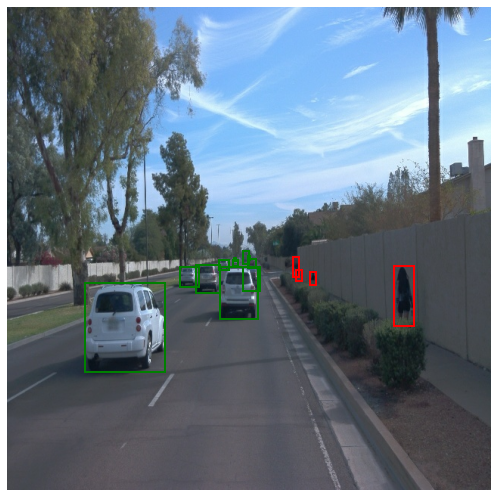

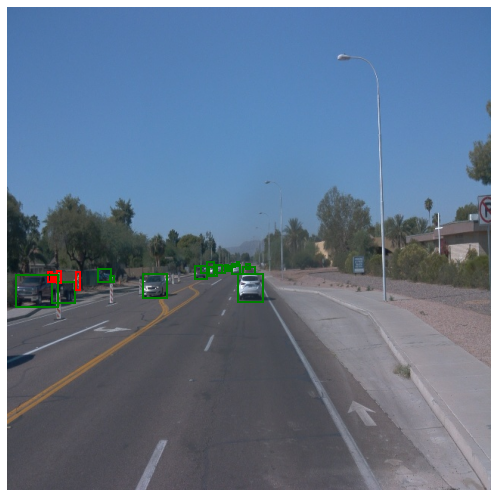

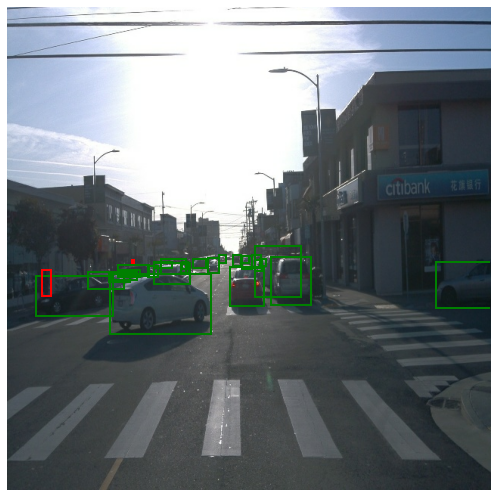

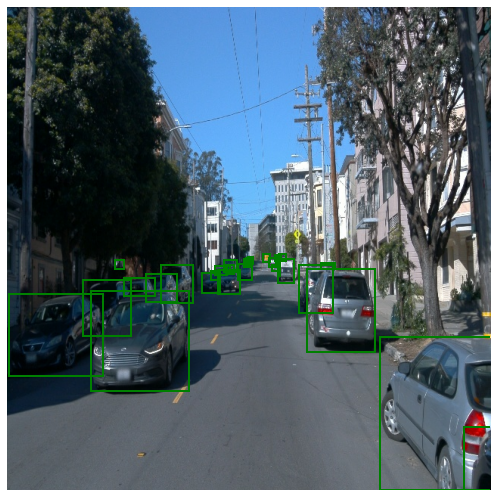

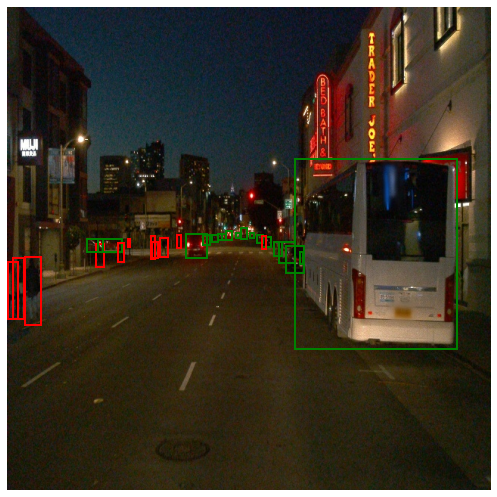

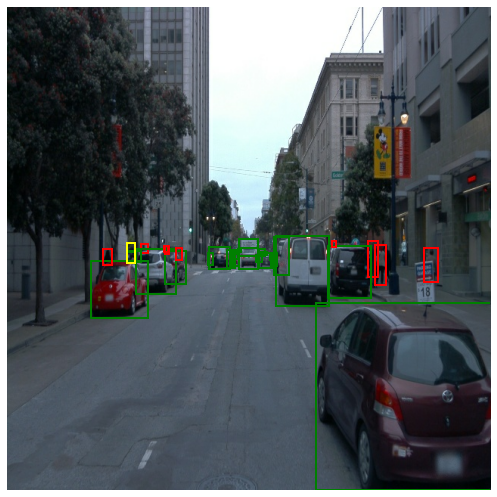

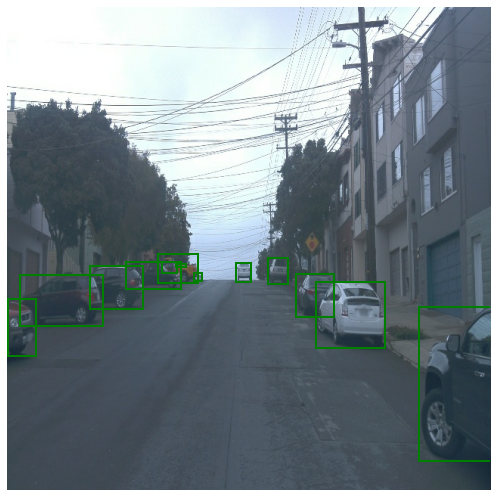

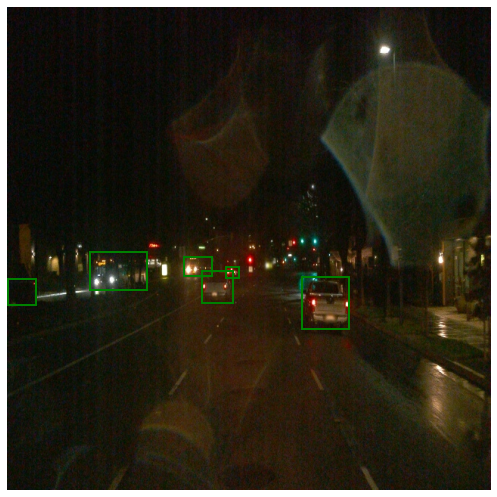

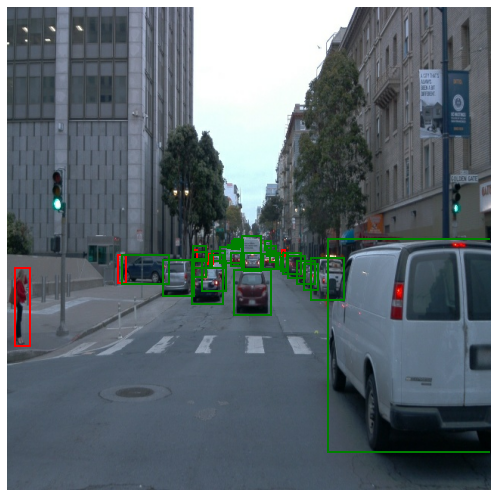

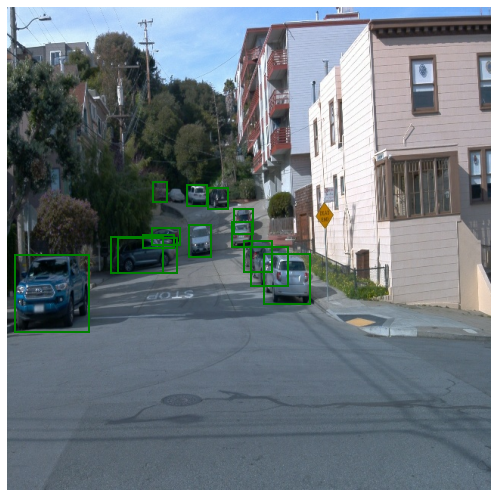

In [8]:
for batch in dataset.shuffle(2000, reshuffle_each_iteration=True).take(10):
    display_instances(batch)

In [9]:
entries_in_unprocessed_dataset = unprocessed_dataset.reduce(0, lambda x, _: x+1).numpy()

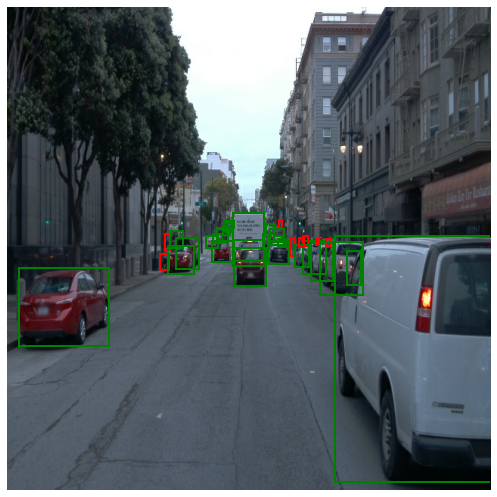

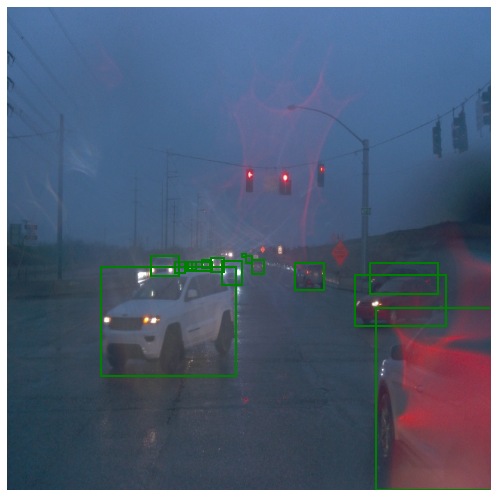

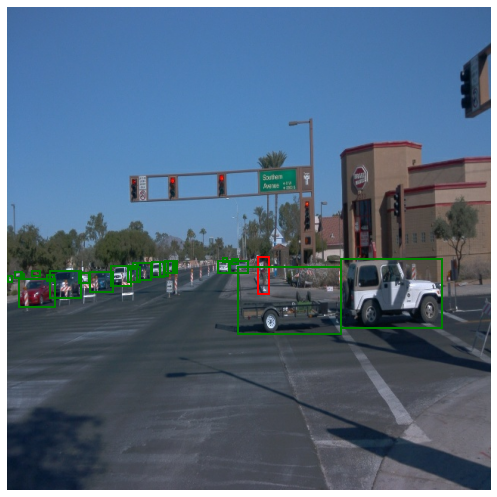

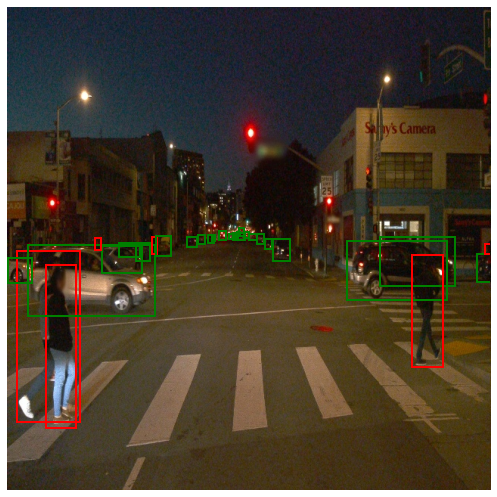

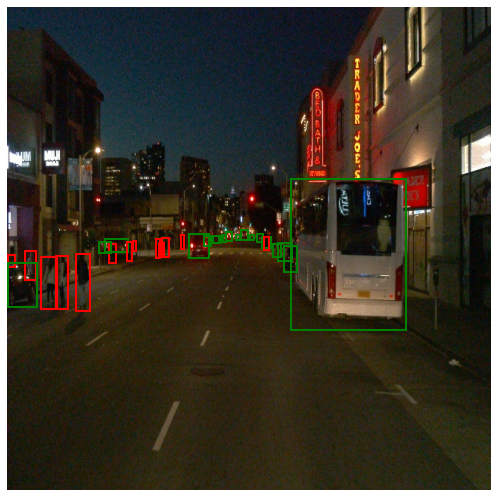

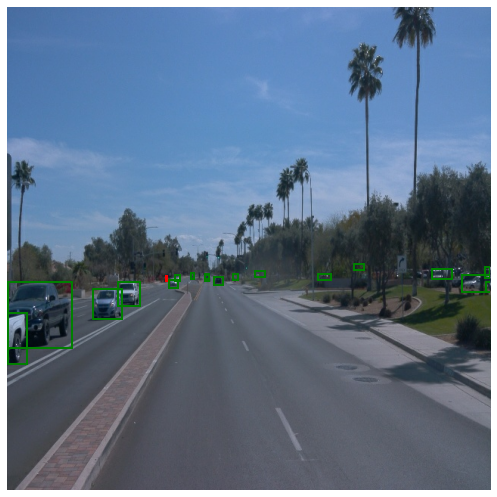

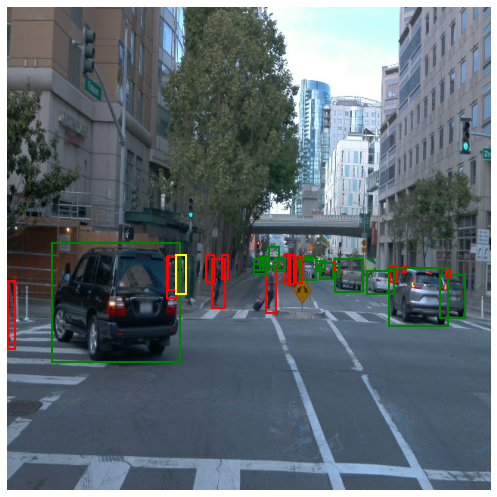

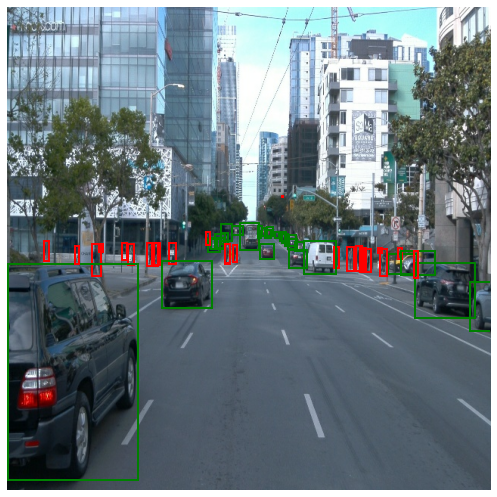

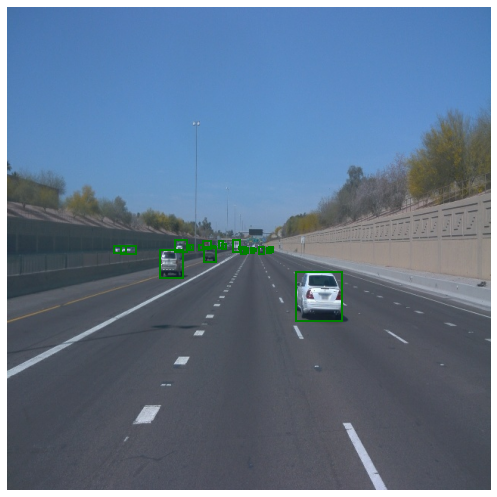

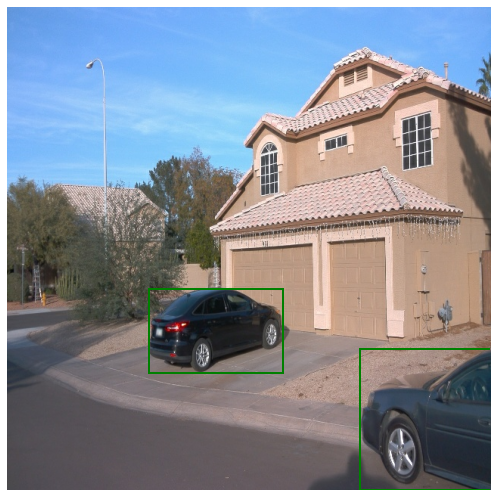

In [10]:
for batch in unprocessed_dataset.shuffle(entries_in_unprocessed_dataset, reshuffle_each_iteration=True).take(10):
    display_unprocessed_instances(batch)

## Additional EDA

In this last part, you are free to perform any additional analysis of the dataset. What else would like to know about the data?
For example, think about data distribution. So far, you have only looked at a single file...

## Count number of entries in the dataset

Knowing the number of entries in the dataset helps us get an idea of how big the dataset is

In [11]:
print(f"Number of entries in the dataset {entries_in_unprocessed_dataset}")

Number of entries in the dataset 19803


## Area and count of classes

Knowing how big are the classes in an image and how many classes are there in an image can help us explore the data further.

In [12]:
classes = ["vehicle", "pedestrian", "cyclist"]
colors = ['green', 'red', 'blue']

In [13]:
area_in_percentage = {}
count = []

for label in classes:
    area_in_percentage[label] = []


for entry in tqdm(unprocessed_dataset, total=entries_in_unprocessed_dataset):
    labels = tf.sparse.to_dense(entry["image/object/class/text"]).numpy()
    widths = tf.sparse.to_dense(entry["image/object/bbox/xmax"]).numpy() - tf.sparse.to_dense(entry["image/object/bbox/xmin"]).numpy()
    heights = tf.sparse.to_dense(entry["image/object/bbox/ymax"]).numpy() - tf.sparse.to_dense(entry["image/object/bbox/ymin"]).numpy()
    areas = widths * heights * 100
    count.append({})
    for label in classes:
        count[-1][label] = 0
    for label, area in zip(labels, areas):
        label = label.decode("utf-8")
        area_in_percentage[label].append(area)
        count[-1][label] += 1

  0%|          | 0/19803 [00:00<?, ?it/s]

### Plotting the relative area of classes in an image

**Box plot** and **Strip plot** can be very useful here to know the distribution.

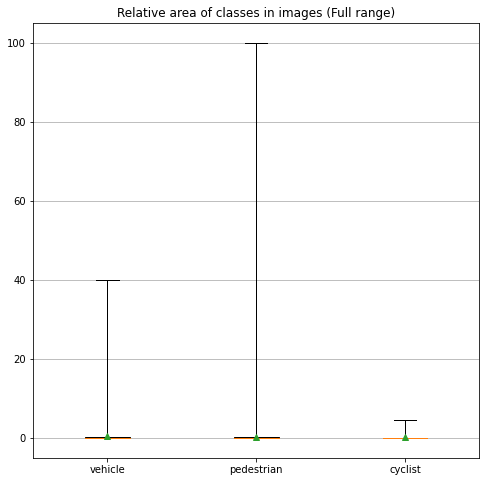

In [14]:
fig, ax = plt.subplots(figsize=(8, 8))
ax.set_title('Relative area of classes in images (Full range)')
ax.yaxis.grid(True)

data = [area_in_percentage[label] for label in classes]
bplot = ax.boxplot(data, whis=[0, 100], showfliers=False, labels=classes, showmeans=True, patch_artist=True)

for patch, color in zip(bplot['boxes'], colors):
    patch.set_facecolor(color)

plt.show()

#### Conclusion from the above plot-

* A single pedestrian can occupy upto 100% of the image (when they are very close to the camera).
* Cyclist have the smallest area. This might be because we are using images from the front camera only. Cycles don't drive in front of car that often (they are mostly in their own lane).
* A single vehicle can occupy upto 40% of the image.
* Mostly, the classes are small in the image.

We can now try to filter the outlies to explore this further-

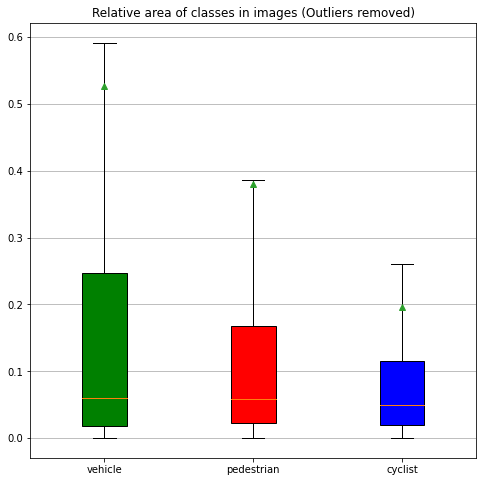

In [15]:
fig, ax = plt.subplots(figsize=(8, 8))
ax.yaxis.grid(True)
ax.set_title('Relative area of classes in images (Outliers removed)')

data = [area_in_percentage[label] for label in classes]
bplot = ax.boxplot(data, showfliers=False, labels=classes, showmeans=True, patch_artist=True)

for patch, color in zip(bplot['boxes'], colors):
    patch.set_facecolor(color)


plt.show()

#### Conclusion from the above plot-

* We were right in saying that most of the classes occupy a small percentage of the image.
* All of the medians are less than 10%.

### Strip plots-

Strip plots can help us visualize the distribution better-

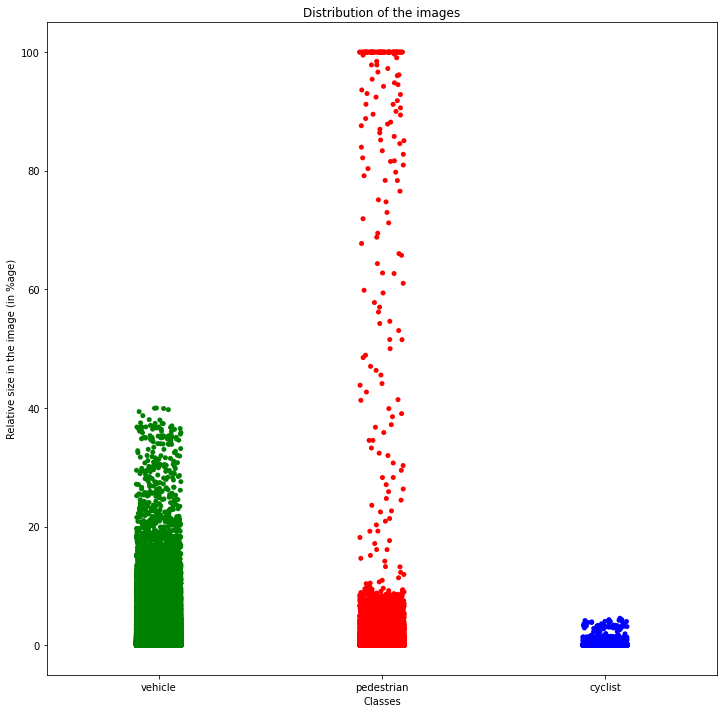

In [16]:
fig, ax = plt.subplots(figsize=(12, 12))
ax = sns.stripplot(data=data, palette=colors)
ax.set(xlabel='Classes', ylabel='Relative size in the image (in %age)', title='Distribution of the images')
ax.set_xticklabels(classes)
plt.show()

#### Conclusion from the above plot-

* Most of the classes occupy a small percentage in an image.
* However, for pedestrians, they get more closer to the vehicles in some scenarios.
* This can be seen in the red cluster on top.
* Vehicle or Cycles won't want to get closer to other images to avoid collision.
* Whereas the owner of a vehicle can interact with their own vehicle and can be a possible reason for the red cluster on top.

#### One important thing-

* Since most of the classes are small, fewer pixels will be representing them.
* Hence, the model might perform poorly on them because the input image is already resized to a smaller size.

### Visualize the count of classes in an image

In [17]:
total_count = {}
for label in classes:
    total_count[label] = 0

for entry in count:
    for label in classes:
        total_count[label] += entry[label]

pd.DataFrame([total_count]).style.hide_index()

vehicle,pedestrian,cyclist
352694,103664,2639


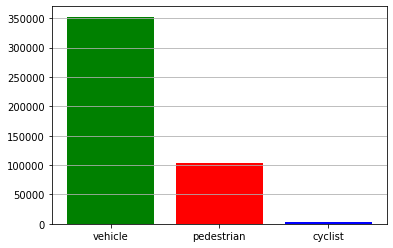

In [18]:
plt.bar([x for x in total_count], [total_count[x] for x in total_count], color=colors)
plt.gca().yaxis.grid(True)

**Conclusion-** There are a total of 3,52,694 vehicles, 1,03,664 pedastrians and 2639 cyclists.

* The classes are highly imbalanced.
* There are a very few cyclists. The model might have difficulty recognizing them.

### Frequency of classes in an image instead of the whole dataset-

How many classes are there in an image?

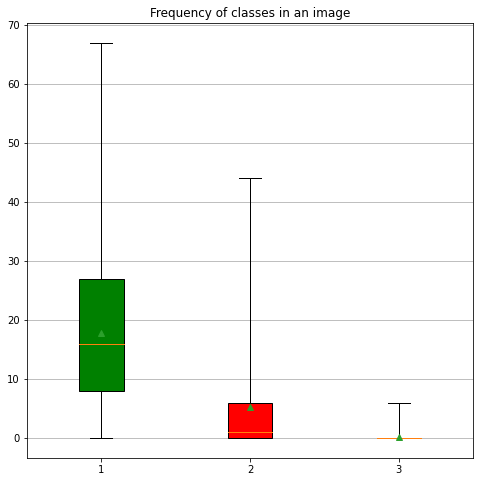

In [19]:
fig, ax = plt.subplots(figsize=(8, 8))
ax.yaxis.grid(True)
ax.set_title('Frequency of classes in an image')

bplot = ax.boxplot([pd.DataFrame(count)[x] for x in classes], whis=[0, 100], showfliers=False, showmeans=True, patch_artist=True)

for patch, color in zip(bplot['boxes'], colors):
    patch.set_facecolor(color)


plt.show()

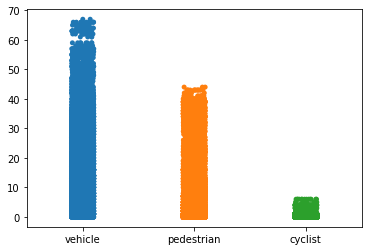

In [20]:
ax = sns.stripplot(data=pd.DataFrame(count))

#### Conclusion of the above two plots-

* There might be no vehicle or pedestrian or cyclists in an image (example a car parked in a garage or an empty road).
* An image won't have more than 70 vehicles, 50 pedestrians and 10 cyclists in our dataset.
* We might want to collect more corner cases for the cyclist datset.

#### Plot of images that have the minimum and maximum number of classes in them.

  0%|          | 0/19803 [00:00<?, ?it/s]

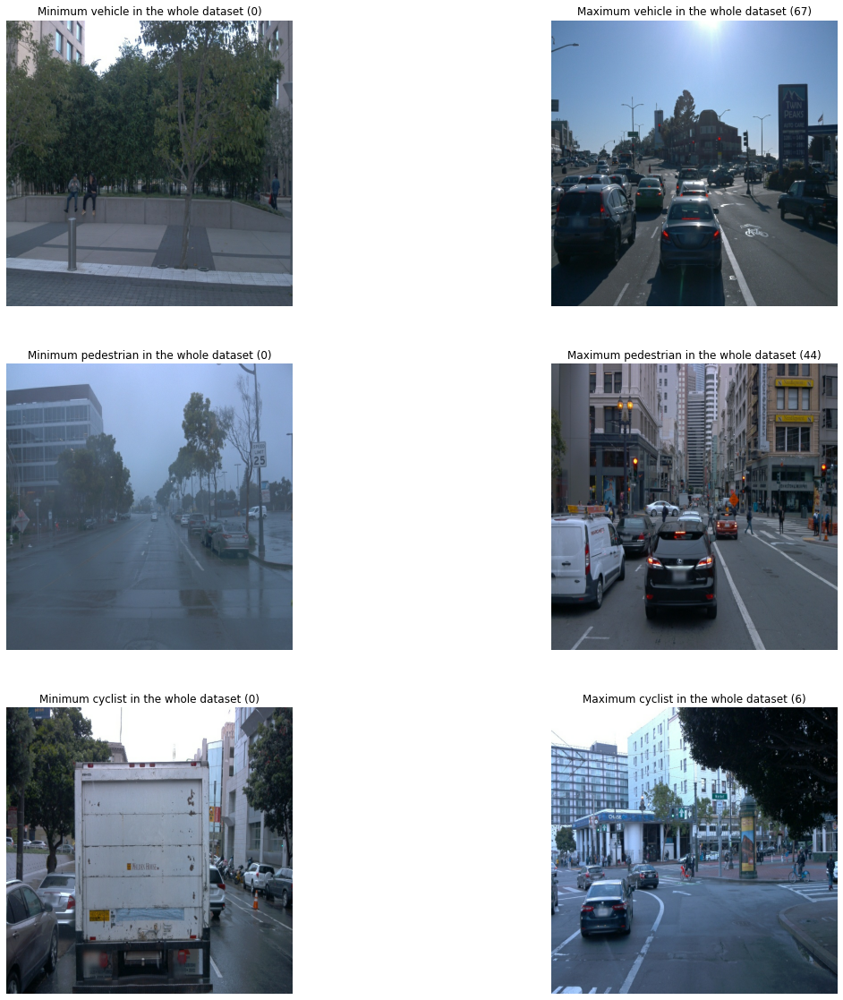

In [21]:
fig, ax = plt.subplots(3, 2, figsize=(20,20))

min_image_data = {}
max_image_data = {}
for label in classes:
    min_image_data[label] = {"count": -1, "image": None}
    max_image_data[label] = {"count": -1, "image": None}


for entry in tqdm(unprocessed_dataset, total=entries_in_unprocessed_dataset):
    labels = tf.sparse.to_dense(entry["image/object/class/text"]).numpy()
    frequency = {}
    for label in classes:
        frequency[label] = 0
    for label in labels:
        frequency[label.decode("utf-8")] += 1
    for label in classes:
        if min_image_data[label]["count"] == -1:
            min_image_data[label]["count"] = frequency[label]
            min_image_data[label]["image"] = tf.io.decode_jpeg(entry["image/encoded"])
        elif frequency[label] < min_image_data[label]["count"]:
            min_image_data[label]["count"] = frequency[label]
            min_image_data[label]["image"] = tf.io.decode_jpeg(entry["image/encoded"])
        
        if max_image_data[label]["count"] == -1:
            max_image_data[label]["count"] = frequency[label]
            max_image_data[label]["image"] = tf.io.decode_jpeg(entry["image/encoded"])
        elif frequency[label] > max_image_data[label]["count"]:
            max_image_data[label]["count"] = frequency[label]
            max_image_data[label]["image"] = tf.io.decode_jpeg(entry["image/encoded"])
            

for i, label in enumerate(classes):
    ax[i][0].imshow(min_image_data[label]["image"])
    ax[i][0].axis("off")
    ax[i][0].set_title(f"Minimum {label} in the whole dataset ({min_image_data[label]['count']})")
    
    ax[i][1].imshow(max_image_data[label]["image"])
    ax[i][1].axis("off")
    ax[i][1].set_title(f"Maximum {label} in the whole dataset ({max_image_data[label]['count']})")

## Are consecutive images in a dataset similar?

If consecutive images are of the same scene with very minor changes, then reshuffling the images might put almost same images in the test train and validation datasets.

In this case, we might have to shuffle the dataset in a way that the same scene is not present in test train and validation datasets.

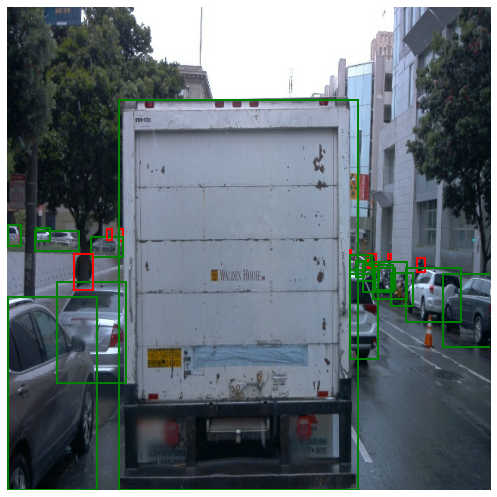

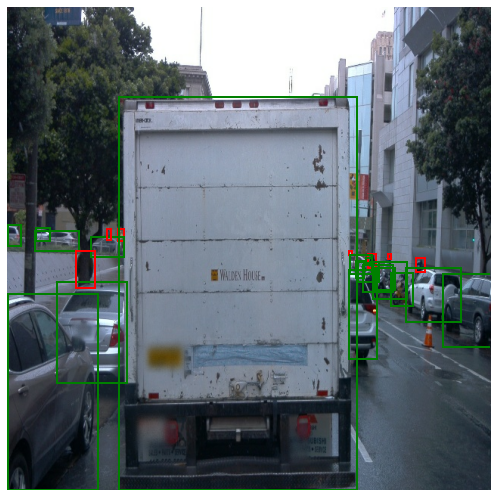

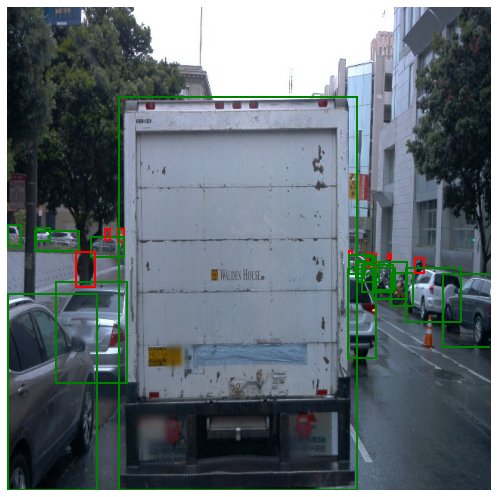

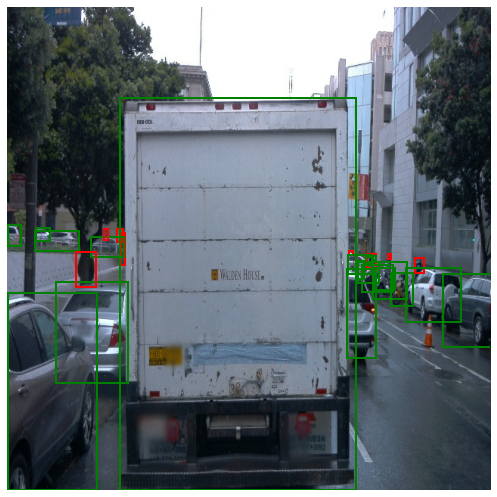

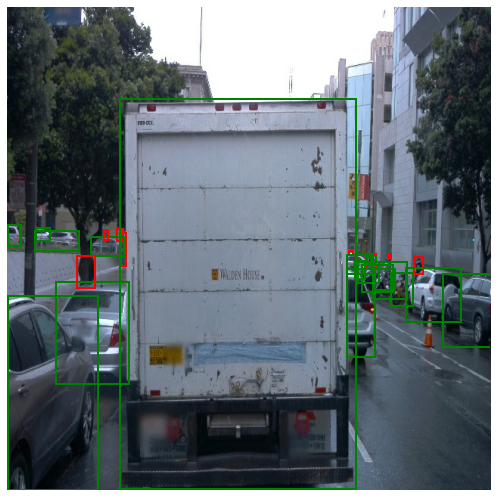

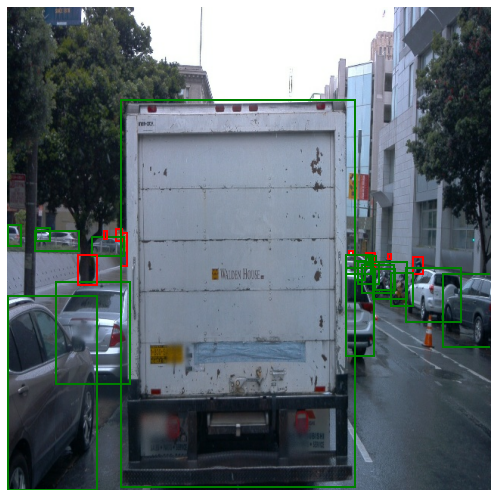

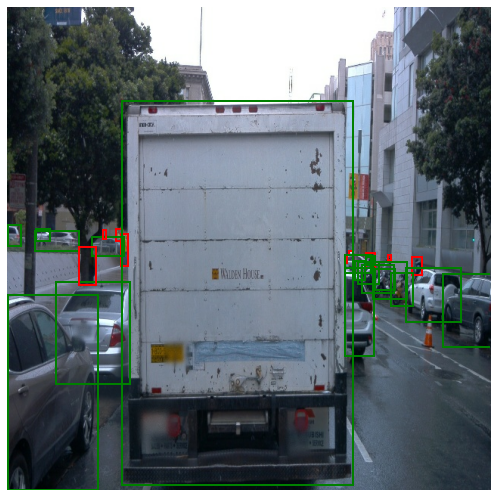

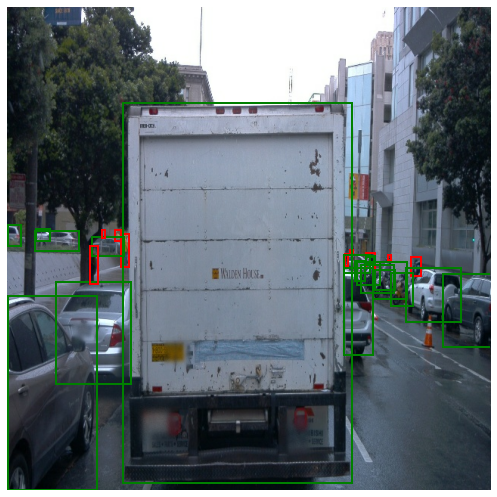

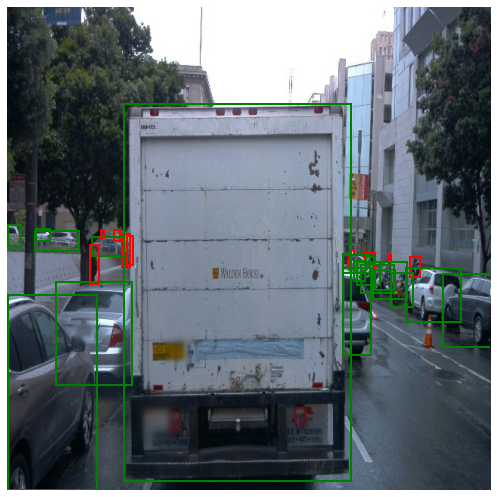

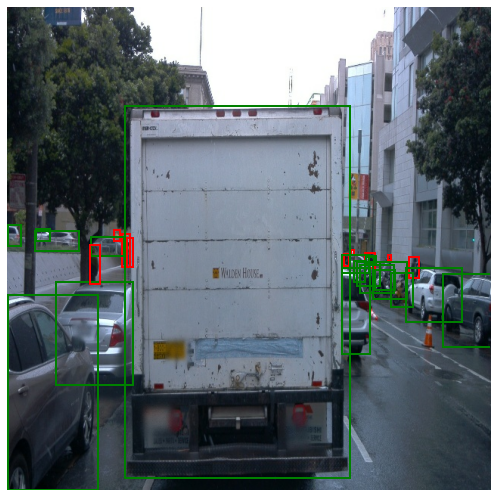

In [22]:
for batch in unprocessed_dataset.take(10):
    display_unprocessed_instances(batch)

Yes, they are almost the same. Hence, we have to be careful with the approach we take for splitting the dataset.